In [3]:
import os
import json

import matplotlib.pyplot as plt
import pandas as pd
from collections import defaultdict

In [4]:
from matplotlib import rcParams

rcParams['font.family'] = 'Malgun Gothic'
rcParams['axes.unicode_minus'] = False

In [15]:
data_dir = '../data'
anno_dir = '../data/train_annotations'

stats = defaultdict(lambda: {'valid': 0, 'missing': 0})
anno_count = 0

for root, dirs, files in os.walk(anno_dir):
    for file in files:
        if not file.endswith('.json'):
            continue
        
        anno_count += 1
        with open(os.path.join(root, file), 'r', encoding='utf-8') as f:
            data = json.load(f)

            if 'annotations' in data:
                name = {c["id"]: c["name"] for c in data["categories"]}

                for ann in data['annotations']:
                    cid = ann['category_id']
                    cname = name.get(cid, f'unk_{cid}')

                    bbox = ann.get('bbox', [])

                    if isinstance(bbox, list) and len(bbox) == 4:
                        stats[cname]['valid'] += 1
                    else:
                        stats[cname]['missing'] += 1

results = [(cname, v['valid'], v['missing']) for cname, v in stats.items()]
df = pd.DataFrame(results, columns=['name', 'valid', 'missing'])
df

,name,valid,missing
0,보령부스파정 5mg,180,0
1,동아가바펜틴정 800mg,139,0
2,낙소졸정 500/20mg,35,0
3,신바로정,35,0
4,가바토파정 100mg,143,0
...,...,...,...
68,쿠에타핀정 25mg,10,0
69,졸로푸트정 100mg,11,0
70,렉사프로정 15mg,9,0
71,브린텔릭스정 20mg,7,0


In [16]:
df[df['missing'] > 0]

,name,valid,missing


In [17]:
print(anno_count)

4526


조금 더 자세히 보긴 해야겠지만, bbox 자체가 누락이 된건 없어보임.

아마 bbox 겹침때문에 누락 처럼 보이지 않았나 싶은데, 좀 더 확인 예정.

In [31]:
import os
import json

def check_overlapping_boxes_json(anno_dir, iou_threshold=0.5):
    """
    JSON 어노테이션 파일들에서 bbox 겹침 확인
    (COCO 형식: bbox = [x, y, w, h])

    Args:
        anno_dir: 어노테이션 JSON들이 들어있는 최상위 폴더
        iou_threshold: IoU가 이 값 이상이면 겹침으로 간주
    """
    overlapping_boxes = []

    # 모든 json 파일 재귀적으로 탐색
    for root, dirs, files in os.walk(anno_dir):
        for file in files:
            if not file.endswith(".json"):
                continue

            json_path = os.path.join(root, file)
            with open(json_path, "r", encoding="utf-8") as f:
                try:
                    data = json.load(f)
                except json.JSONDecodeError:
                    continue

            if "annotations" not in data:
                continue

            boxes = []
            for ann in data["annotations"]:
                bbox = ann.get("bbox", None)
                cid = ann.get("category_id", None)
                if bbox and len(bbox) == 4:
                    x, y, w, h = bbox
                    x1, y1, x2, y2 = x, y, x + w, y + h
                    boxes.append((cid, x1, y1, x2, y2, ann["id"]))

            # 박스끼리 IoU 계산
            for i in range(len(boxes)):
                for j in range(i + 1, len(boxes)):
                    b1 = boxes[i]
                    b2 = boxes[j]

                    # 교집합 좌표
                    x_left = max(b1[1], b2[1])
                    y_top = max(b1[2], b2[2])
                    x_right = min(b1[3], b2[3])
                    y_bottom = min(b1[4], b2[4])

                    if x_right > x_left and y_bottom > y_top:
                        inter = (x_right - x_left) * (y_bottom - y_top)
                        area1 = (b1[3] - b1[1]) * (b1[4] - b1[2])
                        area2 = (b2[3] - b2[1]) * (b2[4] - b2[2])
                        iou = inter / (area1 + area2 - inter)
                        if iou >= iou_threshold:
                            overlapping_boxes.append((
                                file,
                                b1[5], b1[0],  # ann id, class id
                                b2[5], b2[0],
                                iou
                            ))

    # 결과 출력
    if overlapping_boxes:
        print(f"=== JSON 겹치는 박스 {len(overlapping_boxes)}개 발견 ===")
        for file, ann1, cid1, ann2, cid2, iou in overlapping_boxes:
            print(f"{file}: ann {ann1}(cls {cid1}) vs ann {ann2}(cls {cid2}), IoU={iou:.4f}")
    else:
        print("JSON 상에서는 겹치는 박스가 없습니다.")

    return overlapping_boxes


# 사용 예시
anno_dir = "../data/train_annotations"
overlapping_boxes = check_overlapping_boxes_json(anno_dir, iou_threshold=0.5)


JSON 상에서는 겹치는 박스가 없습니다.


In [ ]:
# 그라운딩 다이노

SyntaxError: incomplete input (3648453384.py, line 14)

In [33]:

ANNO_DIR = "../data/train_annotations"  # 최상위 어노테이션 폴더 경로

def check_missing_annos_per_drug(anno_dir, expected_count=3):
    missing = []

    # 최상위 폴더 순회
    for root, dirs, files in os.walk(anno_dir):
        # leaf 폴더 (파일이 있고 json 포함)
        json_files = [f for f in files if f.endswith(".json")]
        if json_files:
            drug_name = os.path.basename(root)  # 예: K-001900, K-016548
            count = len(json_files)
            if count != expected_count:
                missing.append({
                    "folder": root,
                    "drug": drug_name,
                    "count": count,
                    "missing": expected_count - count
                })

    return pd.DataFrame(missing)

# 실행
df_missing = check_missing_annos_per_drug(ANNO_DIR, expected_count=3)

print(f"❌ 어노테이션이 누락된 약 폴더 수: {len(df_missing)}")
df_missing.head(20)

❌ 어노테이션이 누락된 약 폴더 수: 935


,folder,drug,count,missing
0,../data/train_annotations\K-001900-010224-0165...,K-031705,2,1
1,../data/train_annotations\K-001900-010224-0165...,K-016551,2,1
2,../data/train_annotations\K-001900-010224-0165...,K-033009,2,1
3,../data/train_annotations\K-001900-016548-0181...,K-018110,2,1
4,../data/train_annotations\K-001900-016548-0181...,K-021026,2,1
5,../data/train_annotations\K-001900-016548-0181...,K-016548,2,1
6,../data/train_annotations\K-001900-016548-0181...,K-018110,2,1
7,../data/train_annotations\K-001900-016548-0181...,K-018110,2,1
8,../data/train_annotations\K-001900-016548-0181...,K-018110,2,1
9,../data/train_annotations\K-001900-016548-0181...,K-029451,2,1


In [43]:
import os, json

def rotate_bbox_180(bbox, img_w, img_h):
    x, y, w, h = bbox
    x_new = img_w - (x + w)
    y_new = img_h - (y + h)
    return [x_new, y_new, w, h]

def fill_missing_annotations(root_dir):
    required_angles = ["70", "75", "90"]
    filled = []

    # 모든 하위 폴더까지 탐색
    for root, dirs, files in os.walk(root_dir):
        json_files = [f for f in files if f.endswith(".json")]
        if not json_files:
            continue

        print(json_files)

        angles = []
        for f in json_files:
            parts = f.split("_")
            for p in parts:
                if p in ["70", "75", "90"]:
                    angles.append(p)
                    break


        # 누락된 angle 찾아 처리
        if "70" not in angles and "75" in angles:
            template_angle, target_angle, need_rotation = "75", "70", True
        elif "75" not in angles:
            if "70" in angles:  # 75는 70 기반
                template_angle, target_angle, need_rotation = "70", "75", True
            elif "90" in angles:  # 75는 90 기반
                template_angle, target_angle, need_rotation = "90", "75", False
            else:
                continue
        elif "90" not in angles and "75" in angles:
            template_angle, target_angle, need_rotation = "75", "90", False
        else:
            continue  # 누락 없음

        # 템플릿 파일 선택
        template_file = None
        for f in json_files:
            if f"_{template_angle}_" in f:
                template_file = os.path.join(root, f)
                break
        if not template_file:
            continue

        # JSON 읽기
        with open(template_file, "r", encoding="utf-8") as f:
            data = json.load(f)

        img_w = data["images"][0]["width"]
        img_h = data["images"][0]["height"]

        # images 수정
        data["images"][0]["file_name"] = data["images"][0]["file_name"].replace(f"_{template_angle}_", f"_{target_angle}_")
        data["images"][0]["camera_la"] = int(target_angle)

        # annotations 수정 (필요시 bbox 회전)
        if need_rotation:
            for ann in data["annotations"]:
                ann["bbox"] = rotate_bbox_180(ann["bbox"], img_w, img_h)

        # 새 JSON 저장
        new_file = template_file.replace(f"_{template_angle}_", f"_{target_angle}_")
        with open(new_file, "w", encoding="utf-8") as f:
            json.dump(data, f, ensure_ascii=False, indent=2)

        filled.append(new_file)
        print(f"✅ 채움: {new_file} (회전 적용={need_rotation})")
        with open("filled_json_list.txt", "w", encoding="utf-8") as f:
            for path in filled:
                f.write(path + "\n")

    print(f"\n총 {len(filled)}개 json 생성 완료")

In [44]:
anno_test_dir = '../data/train_annotations_test'

fill_missing_annotations(anno_test_dir)

['K-001900-010224-016551-031705_0_2_0_2_70_000_200.json', 'K-001900-010224-016551-031705_0_2_0_2_75_000_200.json', 'K-001900-010224-016551-031705_0_2_0_2_90_000_200.json']
['K-001900-010224-016551-031705_0_2_0_2_70_000_200.json', 'K-001900-010224-016551-031705_0_2_0_2_75_000_200.json', 'K-001900-010224-016551-031705_0_2_0_2_90_000_200.json']
['K-001900-010224-016551-031705_0_2_0_2_70_000_200.json', 'K-001900-010224-016551-031705_0_2_0_2_90_000_200.json']
✅ 채움: ../data/train_annotations_test\K-001900-010224-016551-031705_json\K-031705\K-001900-010224-016551-031705_0_2_0_2_75_000_200.json (회전 적용=True)
['K-001900-010224-016551-033009_0_2_0_2_70_000_200.json', 'K-001900-010224-016551-033009_0_2_0_2_75_000_200.json', 'K-001900-010224-016551-033009_0_2_0_2_90_000_200.json']
['K-001900-010224-016551-033009_0_2_0_2_75_000_200.json', 'K-001900-010224-016551-033009_0_2_0_2_90_000_200.json']
✅ 채움: ../data/train_annotations_test\K-001900-010224-016551-033009_json\K-016551\K-001900-010224-016551-03

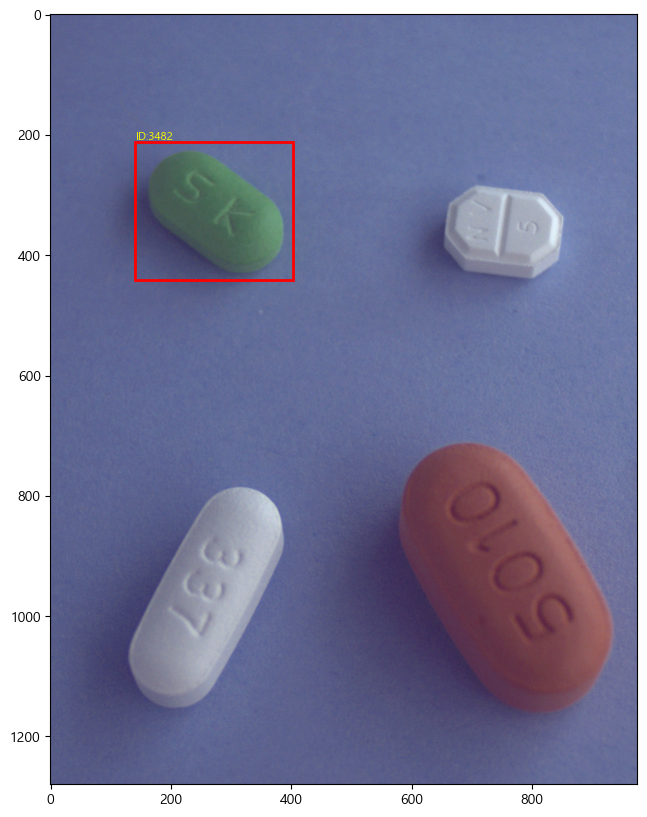

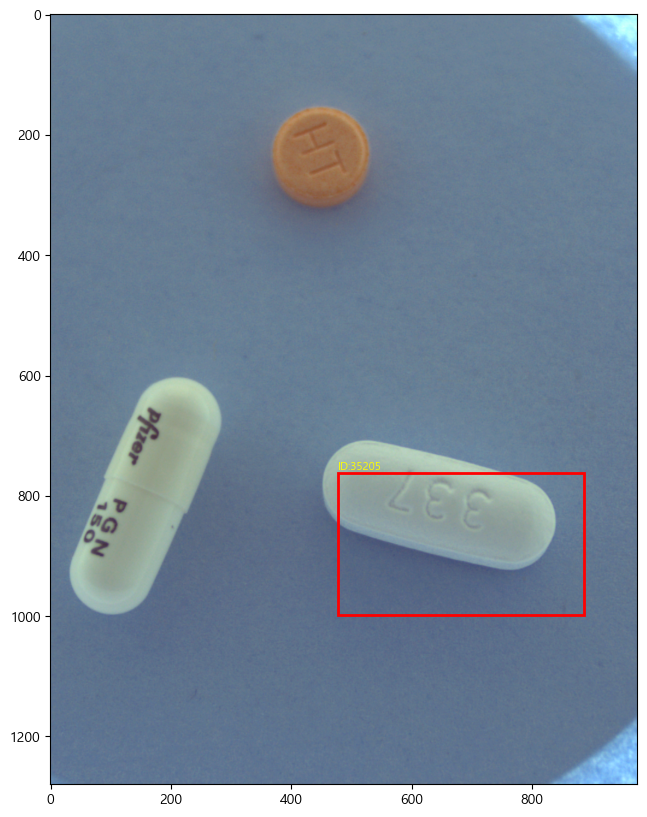

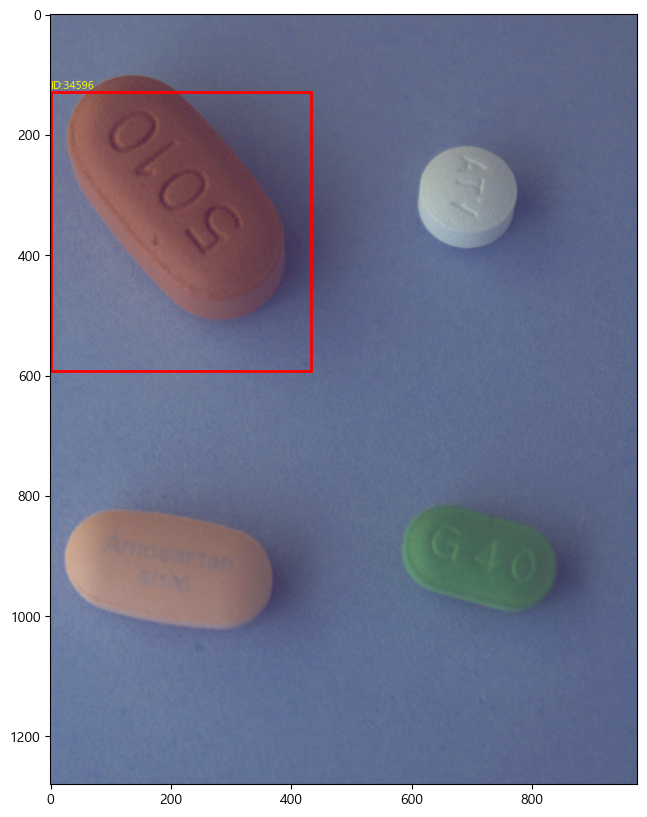

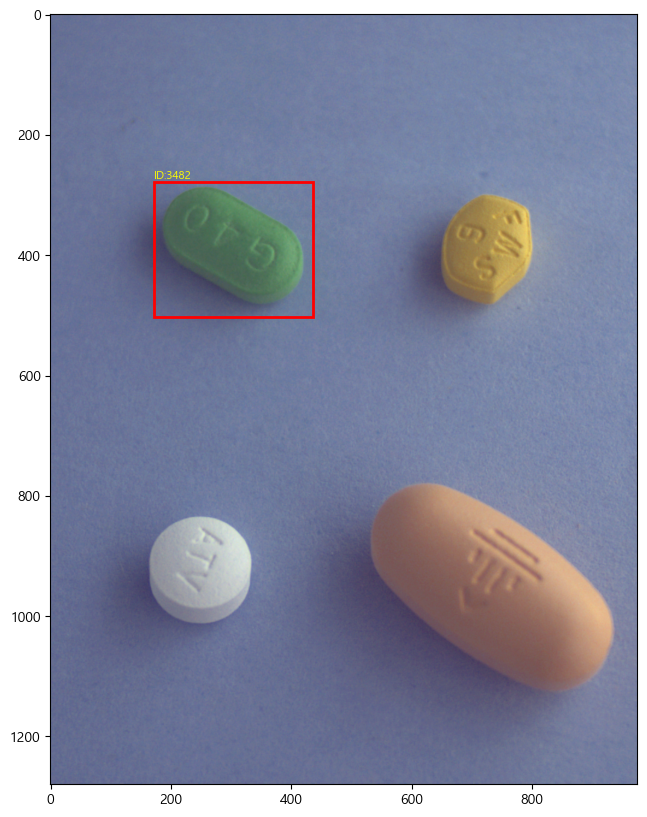

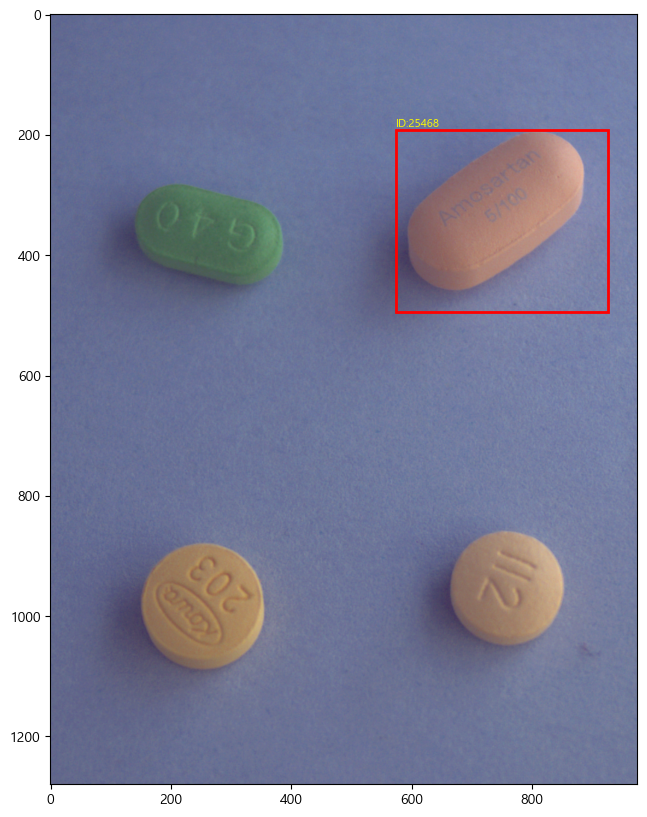

In [45]:
import os, json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_json_bbox(json_path, img_root):
    with open(json_path, "r", encoding="utf-8") as f:
        data = json.load(f)

    img_info = data["images"][0]
    img_file = os.path.join(img_root, img_info["file_name"])
    img = Image.open(img_file)

    fig, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(img)

    for ann in data["annotations"]:
        x, y, w, h = ann["bbox"]
        rect = patches.Rectangle((x, y), w, h, linewidth=2,
                                 edgecolor="r", facecolor="none")
        ax.add_patch(rect)
        ax.text(x, y-5, f"ID:{ann['category_id']}", color="yellow", fontsize=8)

    plt.show()

# 사용 예시
img_root = "../data/train_images"
with open("filled_json_list.txt", "r", encoding="utf-8") as f:
    filled_files = [line.strip() for line in f.readlines()]

# 채운 json 중 5개만 랜덤 확인
import random
for json_path in random.sample(filled_files, 5):
    visualize_json_bbox(json_path, img_root)


In [46]:
from ultralytics import YOLO

# 오빠가 학습시킨 모델 경로
model = YOLO("../src/models/v12_runs/train/weights/best.pt")

In [50]:
def load_filled_json_list(list_path):
    with open(list_path, "r", encoding="utf-8") as f:
        return [line.strip() for line in f if line.strip()]

In [49]:
def correct_bboxes_with_yolo(img_path, json_path, model, conf=0.25, iou_thr=0.5):
    # YOLO 추론
    results = model.predict(img_path, conf=conf, verbose=False)
    preds = results[0].boxes.xywh.cpu().tolist()   # [x_center, y_center, w, h]

    # JSON 로드
    with open(json_path, "r", encoding="utf-8") as f:
        data = json.load(f)

    anns = data.get("annotations", [])
    corrected = []

    for ann in anns:
        x, y, w, h = ann["bbox"]
        ann_box = [x, y, w, h]

        # 기존 박스를 YOLO 예측과 IoU 비교
        best_iou, best_box = 0, None
        for px, py, pw, ph in preds:
            pred_box = [px - pw/2, py - ph/2, pw, ph]  # x,y,w,h
            iou = bbox_iou(ann_box, pred_box)
            if iou > best_iou:
                best_iou, best_box = iou, pred_box

        # IoU가 충분하면 교정
        if best_box and best_iou < iou_thr:
            ann["bbox"] = best_box
            corrected.append((ann["id"], best_iou))

    # JSON 저장
    with open(json_path, "w", encoding="utf-8") as f:
        json.dump(data, f, ensure_ascii=False, indent=2)

    return corrected

def bbox_iou(box1, box2):
    # [x,y,w,h] → [x1,y1,x2,y2]
    def to_xyxy(b):
        return [b[0], b[1], b[0]+b[2], b[1]+b[3]]
    b1 = to_xyxy(box1)
    b2 = to_xyxy(box2)

    inter_x1 = max(b1[0], b2[0])
    inter_y1 = max(b1[1], b2[1])
    inter_x2 = min(b1[2], b2[2])
    inter_y2 = min(b1[3], b2[3])

    if inter_x2 < inter_x1 or inter_y2 < inter_y1:
        return 0.0

    inter_area = (inter_x2 - inter_x1) * (inter_y2 - inter_y1)
    area1 = (b1[2]-b1[0]) * (b1[3]-b1[1])
    area2 = (b2[2]-b2[0]) * (b2[3]-b2[1])
    union = area1 + area2 - inter_area

    return inter_area / union if union > 0 else 0



In [51]:
img_dir = "../data/train_images"
list_path = "filled_json_list.txt"
json_files = load_filled_json_list(list_path)

for json_path in json_files:
    if not os.path.exists(json_path):
        print(f"⚠️ 없는 파일: {json_path}")
        continue

    # JSON에서 이미지 이름 추출
    with open(json_path, "r", encoding="utf-8") as f:
        data = json.load(f)
    img_file = data["images"][0]["file_name"]
    img_path = os.path.join(img_dir, img_file)

    if not os.path.exists(img_path):
        print(f"⚠️ 이미지 없음: {img_file}")
        continue

    corrected = correct_bboxes_with_yolo(img_path, json_path, model)
    if corrected:
        print(f"🔧 {json_path}: {len(corrected)}개 bbox 교정됨 → {corrected}")

🔧 ../data/train_annotations_test\K-001900-016548-021026-024850_json\K-021026\K-001900-016548-021026-024850_0_2_0_2_90_000_200.json: 1개 bbox 교정됨 → [(4508, 0.4992547710843344)]
🔧 ../data/train_annotations_test\K-001900-016548-021026-044199_json\K-021026\K-001900-016548-021026-044199_0_2_0_2_90_000_200.json: 1개 bbox 교정됨 → [(541, 0.4990001041123111)]
🔧 ../data/train_annotations_test\K-001900-016551-019607-027926_json\K-019607\K-001900-016551-019607-027926_0_2_0_2_90_000_200.json: 1개 bbox 교정됨 → [(3633, 0.4653747442826285)]
🔧 ../data/train_annotations_test\K-002483-003743-004378-019552_json\K-002483\K-002483-003743-004378-019552_0_2_0_2_70_000_200.json: 1개 bbox 교정됨 → [(3119, 0.4938828304027081)]
🔧 ../data/train_annotations_test\K-002483-003743-004378-023223_json\K-002483\K-002483-003743-004378-023223_0_2_0_2_70_000_200.json: 1개 bbox 교정됨 → [(5484, 0.48827658197005885)]
🔧 ../data/train_annotations_test\K-002483-003743-012081-019552_json\K-002483\K-002483-003743-012081-019552_0_2_0_2_70_000_200

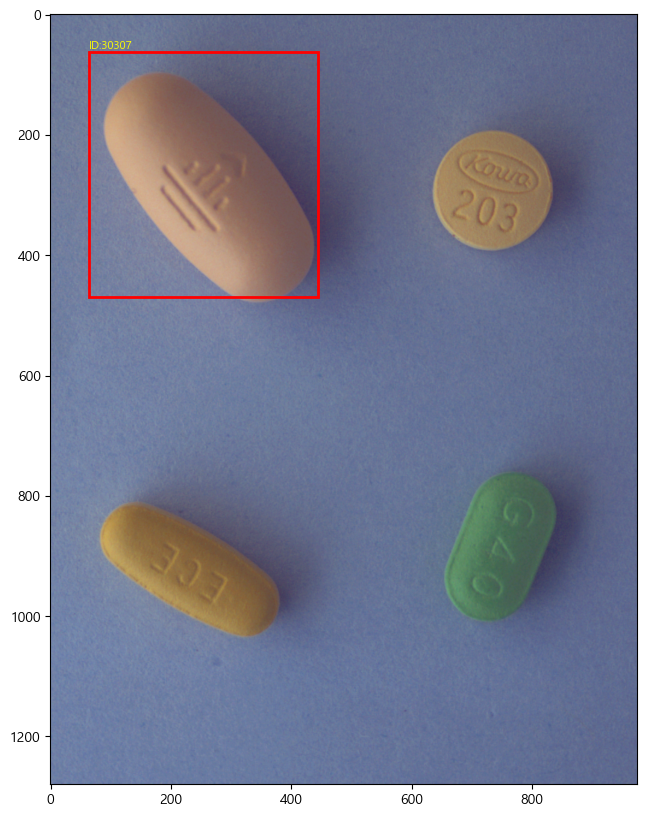

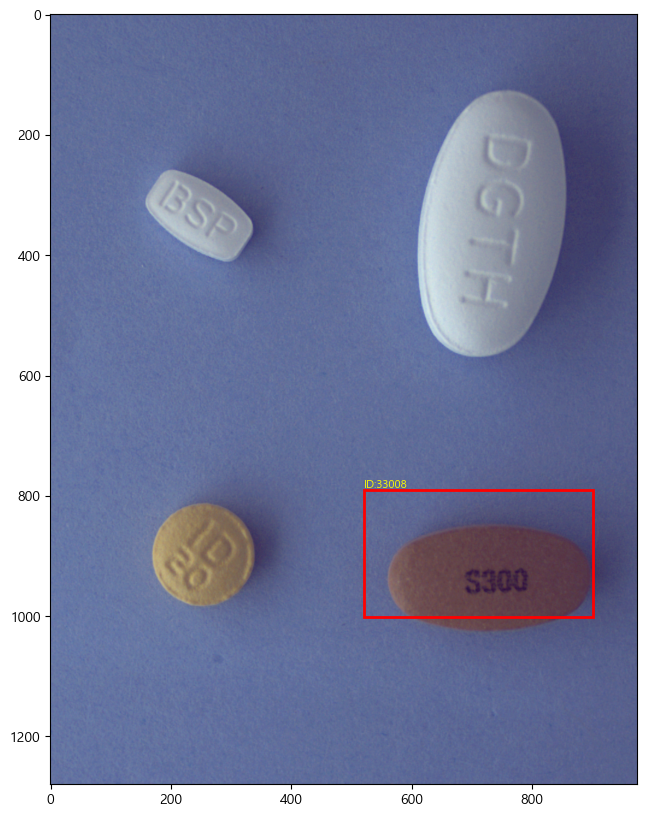

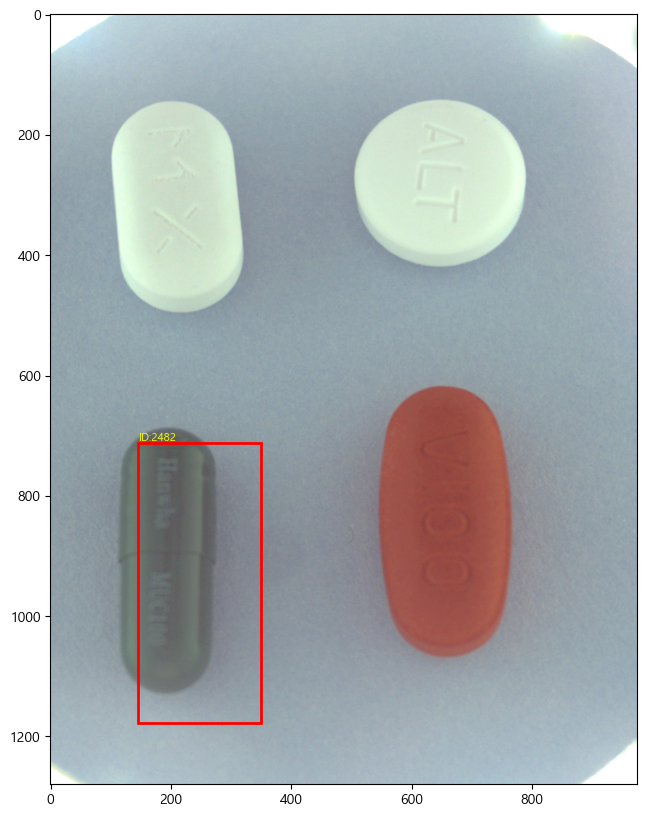

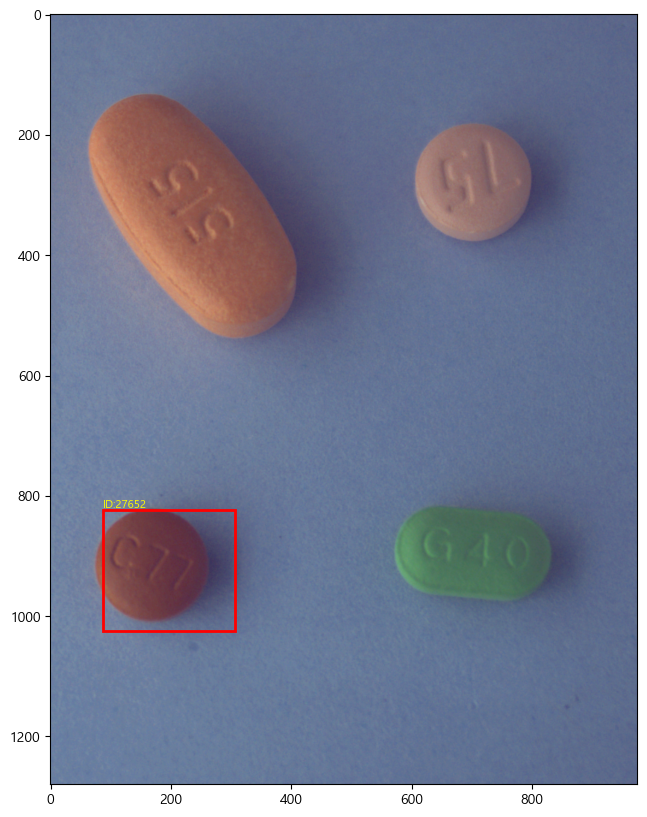

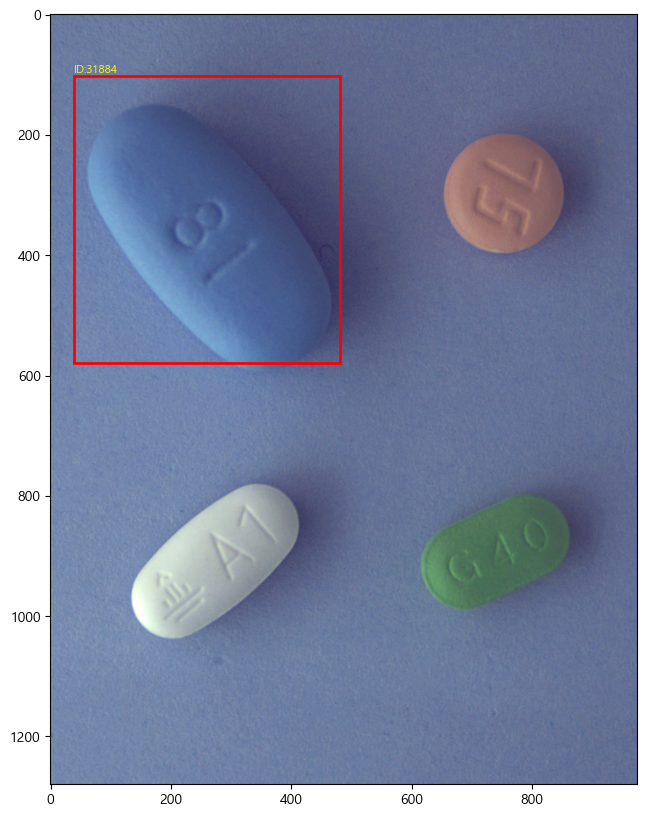

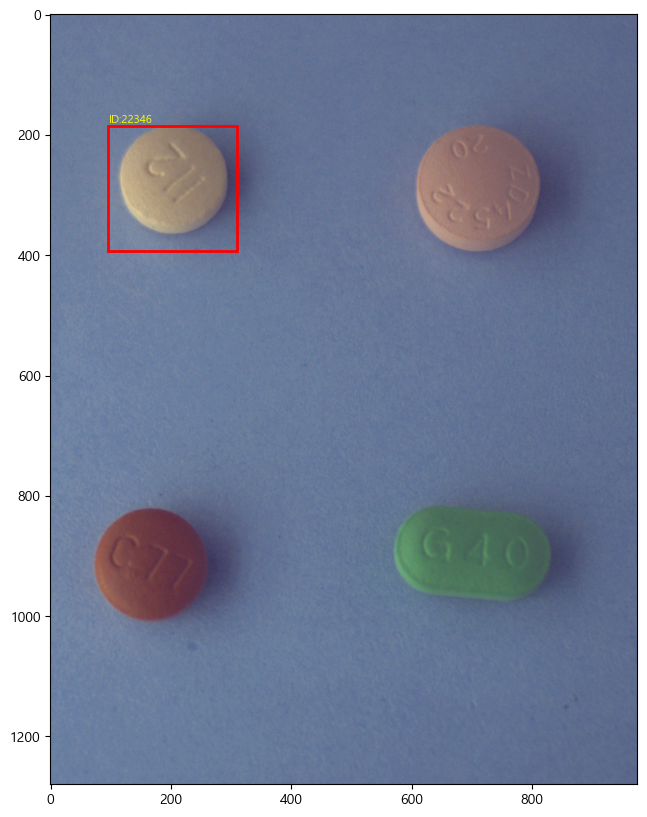

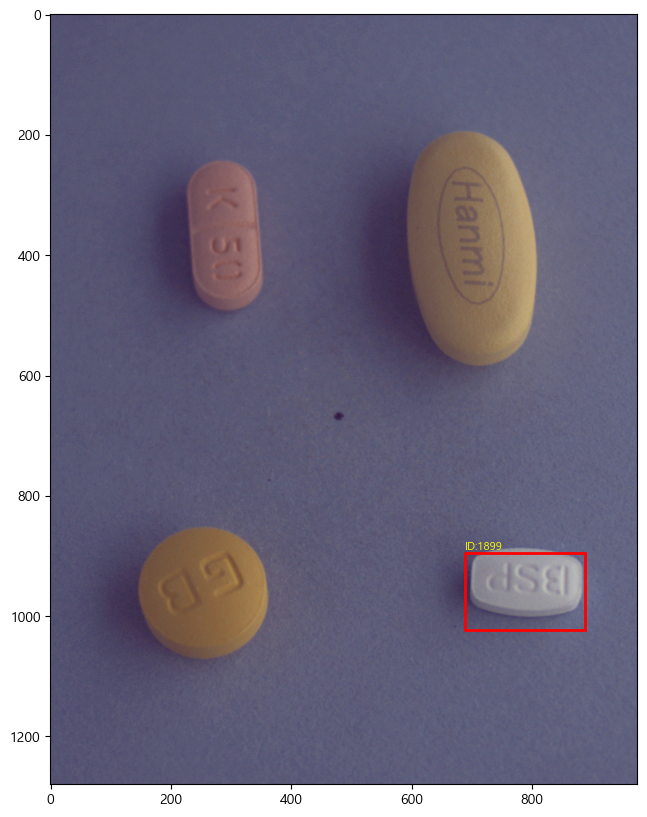

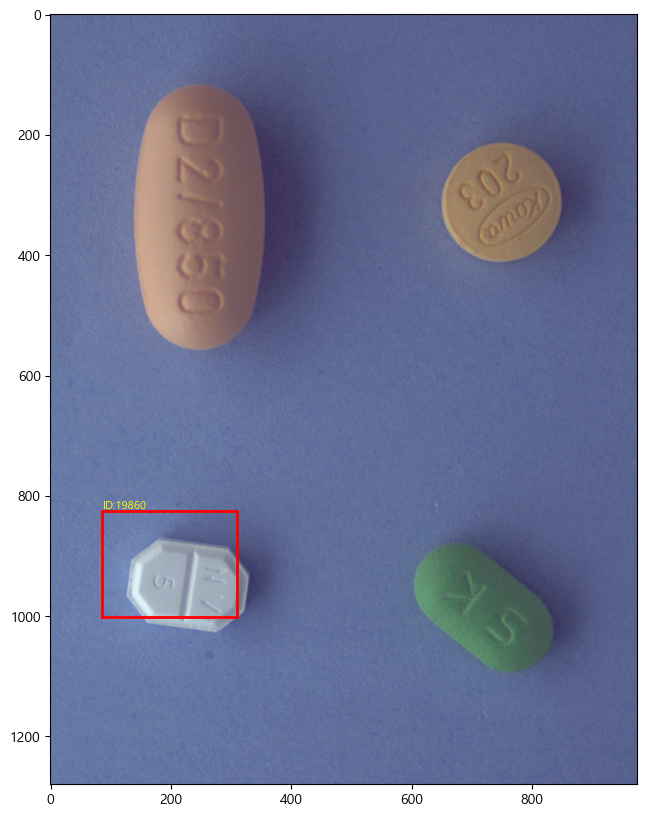

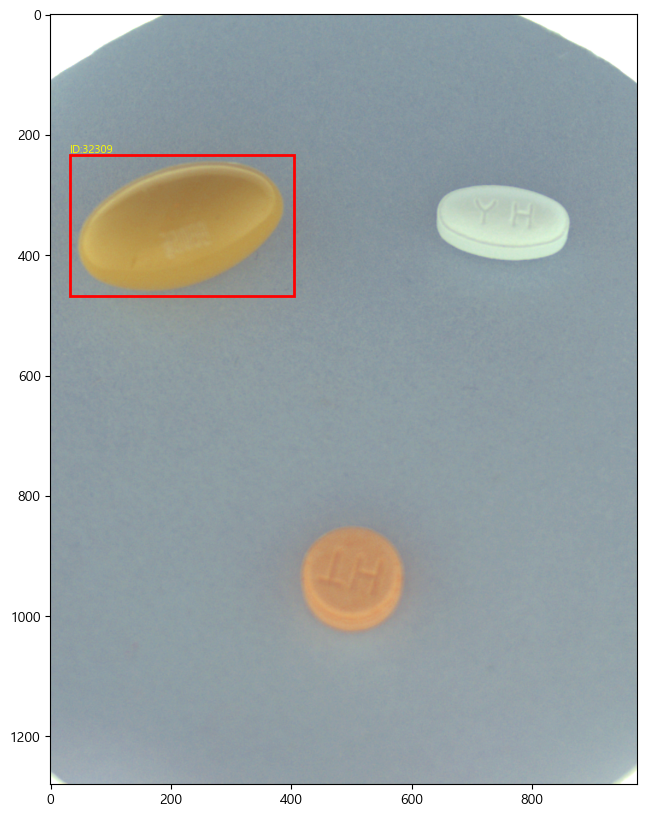

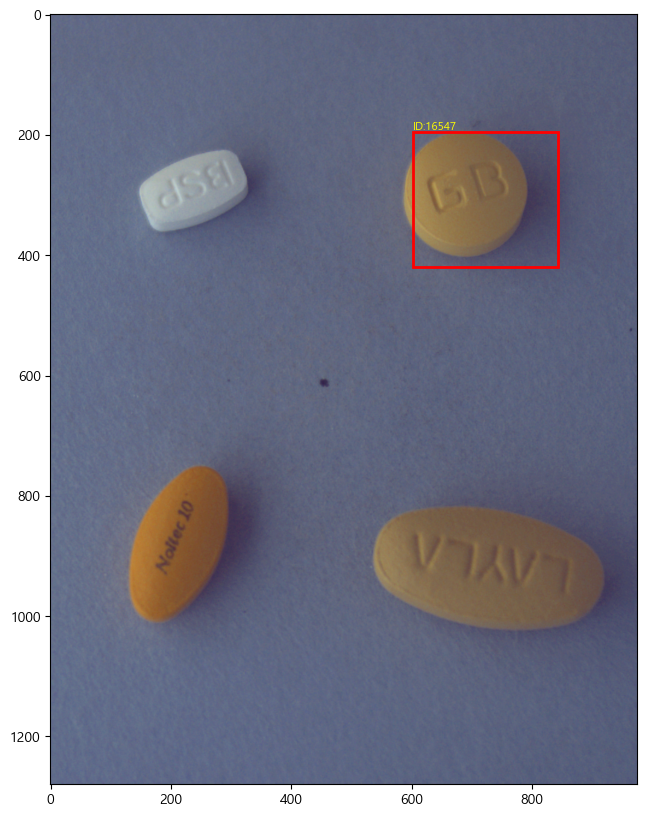

In [53]:
import os, json
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from PIL import Image

def visualize_json_bbox(json_path, img_root):
    with open(json_path, "r", encoding="utf-8") as f:
        data = json.load(f)

    img_info = data["images"][0]
    img_file = os.path.join(img_root, img_info["file_name"])
    img = Image.open(img_file)

    fig, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(img)

    for ann in data["annotations"]:
        x, y, w, h = ann["bbox"]
        rect = patches.Rectangle((x, y), w, h, linewidth=2,
                                 edgecolor="r", facecolor="none")
        ax.add_patch(rect)
        ax.text(x, y-5, f"ID:{ann['category_id']}", color="yellow", fontsize=8)

    plt.show()

# 사용 예시
img_root = "../data/train_images"
with open("filled_json_list.txt", "r", encoding="utf-8") as f:
    filled_files = [line.strip() for line in f.readlines()]

# 채운 json 중 5개만 랜덤 확인
import random
for json_path in random.sample(filled_files, 10):
    visualize_json_bbox(json_path, img_root)


In [59]:
import os, json, random, shutil
from collections import defaultdict
from pathlib import Path

origin_dir = '..'

img_dir = os.path.join(origin_dir, 'data/train_images')
anno_dir = os.path.join(origin_dir, 'data/train_annotations_test')

# 새 YOLO용 경로
yolo_root = os.path.join(origin_dir, 'data_yolo_test')
img_train_dir = os.path.join(yolo_root, 'images/train')
img_val_dir = os.path.join(yolo_root, 'images/val')
lbl_train_dir = os.path.join(yolo_root, 'labels/train')
lbl_val_dir = os.path.join(yolo_root, 'labels/val')

for d in [img_train_dir, img_val_dir, lbl_train_dir, lbl_val_dir]:
    os.makedirs(d, exist_ok=True)

# -----------------------
# 1) 모든 json 모으기
# -----------------------
json_files = []
for root, _, files in os.walk(anno_dir):
    for f in files:
        if f.endswith('.json'):
            json_files.append(os.path.join(root, f))
print('총 JSON 개수:', len(json_files))

# -----------------------
# 2) 전역 class_map (name → id)
# -----------------------
class_map = {}
class_counter = 0
for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        data = json.load(f)
    for cat in data.get('categories', []):
        name = cat['name']
        if name not in class_map:
            class_map[name] = class_counter
            class_counter += 1
print('클래스 개수:', len(class_map))

# -----------------------
# 3) 이미지별 json 묶기
# -----------------------
img2json = defaultdict(list)
for jf in json_files:
    with open(jf, 'r', encoding='utf-8') as f:
        data = json.load(f)
    img_name = data['images'][0]['file_name']
    img2json[img_name].append(jf)
print('총 이미지 개수:', len(img2json))

# -----------------------
# 4) YOLO txt 변환 함수
# -----------------------
def convert_jsons_to_txt(json_list, save_dir, class_map):
    if not json_list: return None
    with open(json_list[0], 'r', encoding='utf-8') as f:
        first_data = json.load(f)
    img = first_data['images'][0]
    img_w, img_h = img['width'], img['height']
    img_name = img['file_name']
    label_path = os.path.join(save_dir, img_name.replace('.png', '.txt'))

    yolo_lines = []
    for jf in json_list:
        with open(jf, 'r', encoding='utf-8') as f:
            data = json.load(f)
        id2name = {cat['id']: cat['name'] for cat in data['categories']}
        for ann in data['annotations']:
            if 'bbox' not in ann or len(ann['bbox']) != 4:
                continue
            x, y, w, h = ann['bbox']
            x_center = (x + w / 2) / img_w
            y_center = (y + h / 2) / img_h
            w /= img_w
            h /= img_h

            cat_id = ann['category_id']
            if cat_id not in id2name:
                continue
            name = id2name[cat_id]
            if name not in class_map:
                continue
            cls_id = class_map[name]

            yolo_lines.append(f'{cls_id} {x_center} {y_center} {w} {h}')

    if yolo_lines:
        with open(label_path, 'w', encoding='utf-8') as f:
            f.write('\n'.join(yolo_lines) + '\n')
    return img_name

# -----------------------
# 5) Split train/val
# -----------------------
images = list(img2json.keys())
random.shuffle(images)
split_idx = int(len(images) * 0.8)
train_imgs, val_imgs = images[:split_idx], images[split_idx:]

print('Train 이미지:', len(train_imgs))
print('Val 이미지:', len(val_imgs))

# -----------------------
# 6) 변환 및 심볼릭 링크 생성
# -----------------------
def symlink(src, dst):
    try:
        os.symlink(src, dst)   # Unix/Linux
    except (AttributeError, OSError):
        # Windows나 권한 문제일 때 fallback
        shutil.copy(src, dst)

# train set
for img_name in train_imgs:
    img_src = os.path.join(img_dir, img_name)
    img_dst = os.path.join(img_train_dir, img_name)

    if not os.path.exists(img_src):
        print(f"⚠️ 이미지 없음, 스킵: {img_name}")
        continue

    if not os.path.exists(img_dst):
        symlink(img_src, img_dst)

    convert_jsons_to_txt(img2json[img_name], lbl_train_dir, class_map)

# val set
for img_name in val_imgs:
    img_src = os.path.join(img_dir, img_name)
    img_dst = os.path.join(img_val_dir, img_name)

    if not os.path.exists(img_src):
        print(f"⚠️ 이미지 없음, 스킵: {img_name}")
        continue

    if not os.path.exists(img_dst):
        symlink(img_src, img_dst)

    convert_jsons_to_txt(img2json[img_name], lbl_val_dir, class_map)

print('YOLO data_yolo 준비 완료 ✅')
print('data_yolo_test/images/train:', len(os.listdir(img_train_dir)))
print('data_yolo_test/labels/train:', len(os.listdir(lbl_train_dir)))

총 JSON 개수: 5461
클래스 개수: 73
총 이미지 개수: 1494
Train 이미지: 1195
Val 이미지: 299
⚠️ 이미지 없음, 스킵: K-003351-019232-029667_0_2_1_2_75_000_200.png
⚠️ 이미지 없음, 스킵: K-003483-016262-019861-034597_0_2_0_2_70_000_200.png
⚠️ 이미지 없음, 스킵: K-003483-016262-027733-031885_0_2_0_2_90_000_200.png
⚠️ 이미지 없음, 스킵: K-003351-016232-018357_0_2_0_2_70_000_200.png
⚠️ 이미지 없음, 스킵: K-003351-013900-016688_0_2_0_2_90_000_200.png
YOLO data_yolo 준비 완료 ✅
data_yolo_test/images/train: 1190
data_yolo_test/labels/train: 1190


In [60]:
import os

class_ids = set()

for split in ['train', 'val']:
    split_dir = os.path.join(label_root, split)
    for f in os.listdir(split_dir):
        if f.endswith('.txt'):
            with open(os.path.join(split_dir, f), 'r', encoding='utf-8') as ftxt:
                for line in ftxt:
                    cls_id = int(line.split()[0])
                    class_ids.add(cls_id)

print('클래스 개수:', len(class_ids))
print('클래스 ID 목록:', sorted(class_ids))

클래스 개수: 0
클래스 ID 목록: []


In [61]:
import yaml

yaml_path = '../configs/yolo_data_test.yaml'

data_yaml = {
    'train': '../data_yolo_test/images/train',
    'val': '../data_yolo_test/images/val',
    'nc': len(class_map),
    'names': [name for name, _ in sorted(class_map.items(), key=lambda x: x[1])]
}

with open(yaml_path, 'w', encoding='utf-8') as f:
    yaml.dump(data_yaml, f, allow_unicode=True)

print(f'yaml 저장 완료 → {yaml_path}')

yaml 저장 완료 → ../configs/yolo_data_test.yaml
